In [26]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
bs = 32 # batch size
version = 5

In [27]:
!pip install -Uqq fastai

In [28]:
from fastai import *
from fastai.vision.all import *
from fastai.vision.widgets import *

In [29]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [31]:
%cd /content/drive/MyDrive/Mastercourse_Project/Traffic sign detection

/content/drive/MyDrive/Mastercourse_Project/Traffic sign detection


In [30]:
data_path = "traffic_sign_data"
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.15, seed=10),
    get_y=parent_label,
    item_tfms=Resize(128))

In [32]:
image_counts = get_image_files(data_path)
len(image_counts)

3288

In [33]:
dblock = dblock.new(item_tfms=RandomResizedCrop(224, min_scale=0.5), batch_tfms=aug_transforms())
dls = dblock.dataloaders(data_path, bs = bs)


In [34]:
torch.save(dls, f"dataloaders/traffic_dataloader_v{version}.pkl")


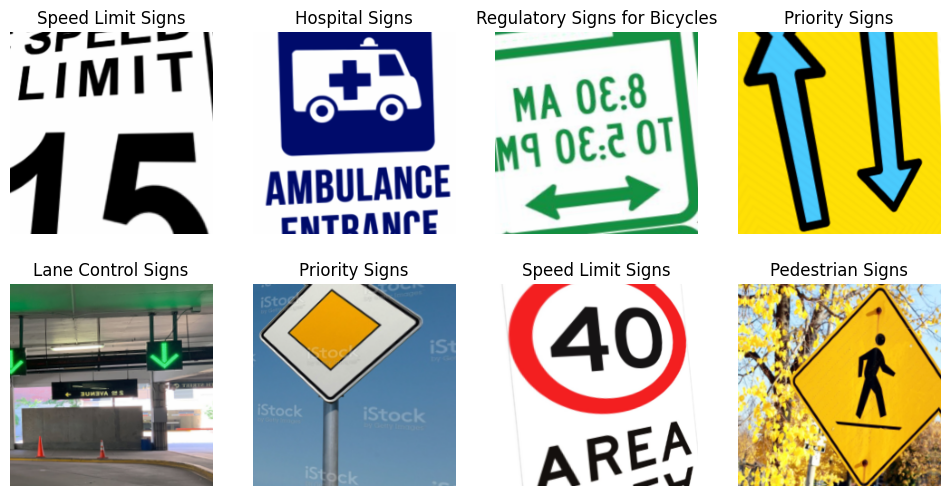

In [35]:
dls.train.show_batch(max_n=8, nrows=2)

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


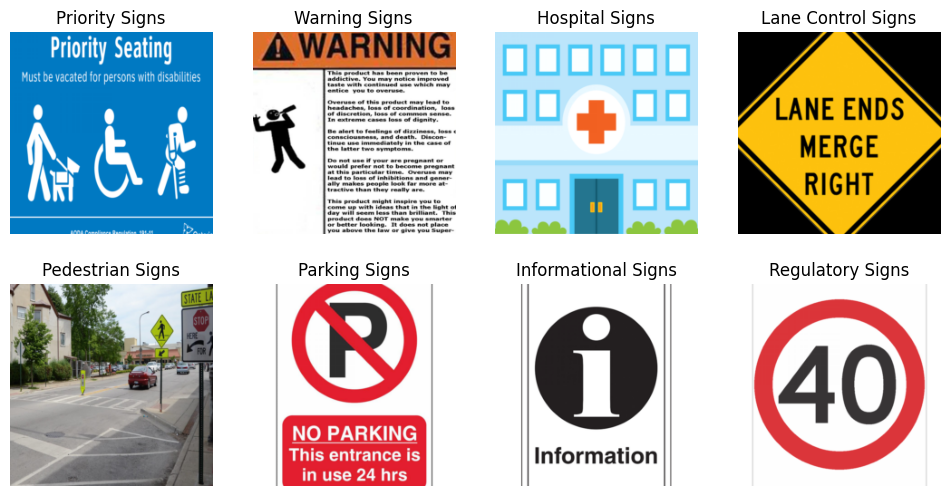

In [36]:
dls.valid.show_batch(max_n=8, nrows=2)

In [37]:
model_path = "models"

In [38]:
model = vision_learner(dls, resnet34, metrics=[error_rate,accuracy])

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [39]:
model.load(f"traffic_sign_recognizer-v{version-5}")


In [40]:
model.fine_tune(1)


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.817234,0.652616,0.194726,0.805274,19:04


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.911734,0.747862,0.227181,0.772819,27:25


In [14]:
model.save(f"traffic_sign_recognizer-v{version}")

Path('models/traffic_sign_recognizer-v5.pth')

<Figure size 1000x1000 with 0 Axes>

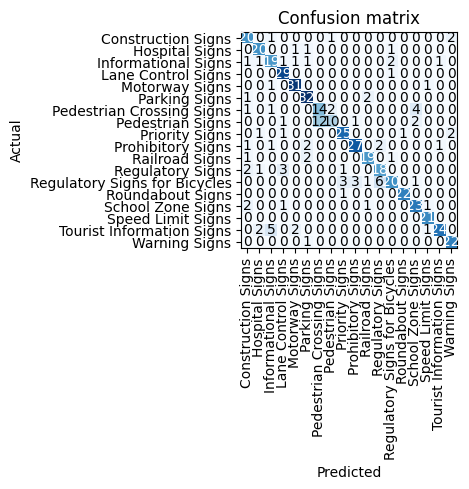

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
interp=ClassificationInterpretation.from_learner(model)
interp.plot_confusion_matrix()

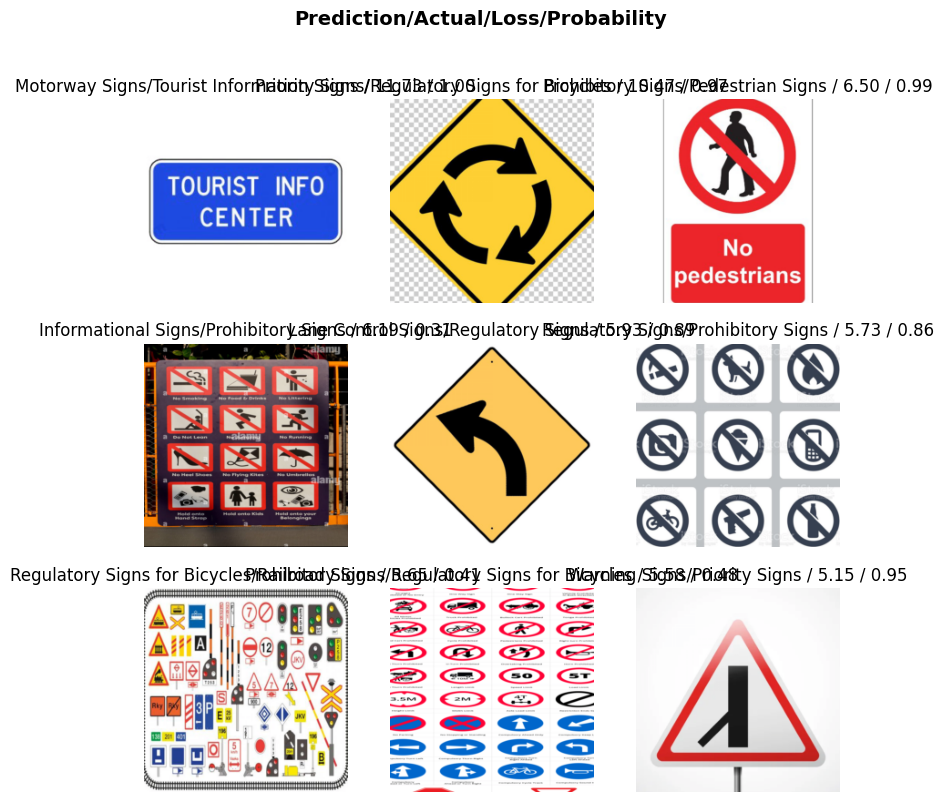

In [ ]:
interp.plot_top_losses(9, nrows=3)

In [15]:
cleaner = ImageClassifierCleaner(model)
cleaner

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:975: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [18]:
cleaner.delete()

(#2) [3,18]

In [21]:
cleaner.change()

(#1) [(5, 'Hospital Signs')]

In [24]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()                                    # delete irrelevant data
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), f"{data_path}/{cat}")

In [25]:
model.export(f"{model_path}/traffic_sign-recognizer-v{version}.pkl")

In [ ]:
# for i in image_counts:
#   try:
#      model.fine_tune(10)
#   except:
#     continue


In [ ]:
# model.load(f"traffic_sign_recognizer-v{version}")

In [ ]:
model.dls.vocab

['Construction Signs', 'Hospital Signs', 'Informational Signs', 'Lane Control Signs', 'Motorway Signs', 'Parking Signs', 'Pedestrian Crossing Signs', 'Pedestrian Signs', 'Priority Signs', 'Prohibitory Signs', 'Railroad Signs', 'Regulatory Signs', 'Regulatory Signs for Bicycles', 'Roundabout Signs', 'School Zone Signs', 'Speed Limit Signs', 'Tourist Information Signs', 'Warning Signs']